In [0]:
!pip3 install http://download.pytorch.org/whl/cu80/torch-0.3.0.post4-cp36-cp36m-linux_x86_64.whl 
!pip3 install torchvision

In [0]:
!wget https://cdn.pixabay.com/photo/2017/02/07/16/47/kingfisher-2046453_960_720.jpg -O bird1.jpg
!wget http://www.dreams.metroeve.com/wp-content/uploads/2017/05/dreams.metroeve_face-dreams-meaning.jpg -O face1.jpg
!wget "http://epilepsyu.com/wp-content/uploads/2014/01/happy-people-1050x600.jpg" -O people.jpg
!wget "https://cdn.vox-cdn.com/thumbor/ZozzaEdjsgqUX3W-tKsqal2JXCc=/0x0:2000x1333/1200x800/filters:focal(840x507:1160x827)/cdn.vox-cdn.com/uploads/chorus_image/image/55348079/170508_10_27_41_5DS29248.0.jpg" -O building.jpg
!wget https://raw.githubusercontent.com/google/deepdream/master/sky1024px.jpg -O sky.jpg
!wget https://cars.usnews.com/static/images/Auto/izmo/i55764847/2018_ford_mustang_angularfront.jpg -O car.jpg
!wget https://news.globallandscapesforum.org/wp-content/uploads/2015/09/roadmap-to-landscapes-finance-1.jpg -O landscape1.jpg
!wget http://www.catster.com/wp-content/uploads/2017/12/A-kitten-meowing.jpg -O kitten.jpg
!wget "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/687px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg" -O mona.jpg
!wget http://www.globeslice.com/wp-content/uploads/2016/02/Yangon-Street-Market-Food-Seats.jpg -O market.jpg
!wget "http://wallpaperswide.com/download/panoramic_mountain_landscape-wallpaper-1024x768.jpg" -O landscape2.jpg

In [0]:
import numpy as np
import torch
from torch.autograd import Variable
from torch.optim import SGD
from torchvision import models, transforms
import PIL
import os
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
import scipy.ndimage as ndimage

%matplotlib inline

import scipy.ndimage as nd
import PIL.Image
from IPython.display import clear_output, Image, display
from io import BytesIO


def showarray(a, fmt='jpeg'):
    a = np.uint8(np.clip(a, 0, 255))
    f = BytesIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))
    
def showtensor(a):
    mean = np.array([0.485, 0.456, 0.406]).reshape([1, 1, 3])
    std = np.array([0.229, 0.224, 0.225]).reshape([1, 1, 3])
    inp = a[0, :, :, :]
    inp = inp.transpose(1, 2, 0)
    inp = std * inp + mean
    inp *= 255
    showarray(inp)
    clear_output(wait=True)

def plot_images(im, titles=None):
    plt.figure(figsize=(30, 20))
    
    for i in range(len(im)):
        plt.subplot(10 / 5 + 1, 5, i + 1)
        plt.axis('off')
        if titles is not None:
            plt.title(titles[i])
        plt.imshow(im[i])
        
    plt.pause(0.001)
    
normalise = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

normalise_resize = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def init_image(size=(400, 400, 3)):
    img = PIL.Image.fromarray(np.uint8(np.full(size, 150)))
    img = PIL.Image.fromarray(np.uint8(np.random.uniform(150, 180, size)))
    img_tensor = normalise(img).unsqueeze(0)
    img_np = img_tensor.numpy()
    return img, img_tensor, img_np

def load_image(path, resize=False):
    img = PIL.Image.open(path)
    if resize:
        img_tensor = normalise_resize(img).unsqueeze(0)
    else:
        img_tensor = normalise(img).unsqueeze(0)
    img_np = img_tensor.numpy()
    return img, img_tensor, img_np

def tensor_to_img(t):
    a = t.numpy()
    mean = np.array([0.485, 0.456, 0.406]).reshape([1, 1, 3])
    std = np.array([0.229, 0.224, 0.225]).reshape([1, 1, 3])
    inp = a[0, :, :, :]
    inp = inp.transpose(1, 2, 0)
    inp = std * inp + mean
    inp *= 255
    inp = np.uint8(np.clip(inp, 0, 255))
    return PIL.Image.fromarray(inp)

def image_to_variable(image, requires_grad=False, cuda=False):
    if cuda:
        image = Variable(image.cuda(), requires_grad=requires_grad)
    else:
        image = Variable(image, requires_grad=requires_grad)
    return image

In [0]:
model = models.vgg16(pretrained=True)

In [3]:
use_gpu = False
if torch.cuda.is_available():
    use_gpu = True

print(model)

for param in model.parameters():
    param.requires_grad = False

if use_gpu:
    model.cuda()

VGG(
  (features): Sequential(
    (0): Conv2d (3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d (64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (5): Conv2d (64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d (128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (10): Conv2d (128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d (256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d (256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (17): Conv2d (256, 512, kernel_size=(3, 3), 

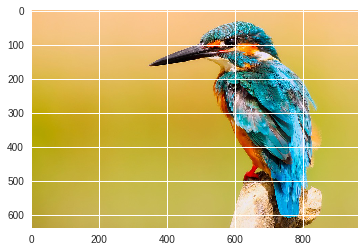

Variable containing:
 92
[torch.cuda.LongTensor of size 1 (GPU 0)]



In [4]:
img, img_tensor, img_np = load_image('bird1.jpg', resize=True)

plt.imshow(img)
plt.pause(0.001)

model.eval()
output = model(image_to_variable(img_tensor, cuda=use_gpu))
val, index = torch.max(output, 1)
print(index)

In [0]:
images = []
titles = []
gfig = plt.figure(figsize=(12, 7))
gif = plt.imshow(np.uint8(np.random.uniform(150, 180, (224, 224, 3))), animated=True)
gif.axes.get_xaxis().set_visible(False)
gif.axes.get_yaxis().set_visible(False)
gif_title = plt.axes().text(1.5, 2, '', transform = plt.axes().transAxes, horizontalalignment='center')


In [0]:
def plot_image(im, title = None):
    plt.figure(figsize=(20, 10))
    plt.imshow(im)
    plt.pause(0.001)
    
def plot_images(im, titles=None):
    plt.figure(figsize=(30, 20))
    
    for i in range(len(im)):
        plt.subplot(10 / 5 + 1, 5, i + 1)
        plt.axis('off')
        if titles is not None:
            plt.title(titles[i])
        plt.imshow(im[i])
        
    plt.pause(0.001)

def gif_init():
    global gfig
    gfig = plt.figure(figsize=(12, 7))
    git_title.set_text('')
    gif.set_data([0], [0])
    return gif, gif_title
    
def generate_gif(i):
    global images, titles, gif
    gif_title.set_text(titles[i])
    gif.set_array(images[i])
    return gif, gif_title

def show_animation():
    global gfig 
    return animation.FuncAnimation(gfig, generate_gif, init_func=gif_init, frames=10,interval=2000)

## Octaver function

In [0]:
def octaver_fn(model, base_img, step_fn, octave_n=6, octave_scale=1.4, iter_n=10, **step_args):
    octaves = [base_img]
    
    for i in range(octave_n - 1):
        octaves.append(nd.zoom(octaves[-1], (1, 1, 1.0 / octave_scale, 1.0 / octave_scale), order=1))

    detail = np.zeros_like(octaves[-1])
    for octave, octave_base in enumerate(octaves[::-1]):
        h, w = octave_base.shape[-2:]
        
        if octave > 0:
            h1, w1 = detail.shape[-2:]
            detail = nd.zoom(detail, (1, 1, 1.0 * h / h1, 1.0 * w / w1), order=1)
       
        src = octave_base + detail
       
        for i in range(iter_n):
            src = step_fn(model, src, **step_args)

        detail = src.numpy() - octave_base

    return src

## Filter Visualization

In [0]:
def filter_step(model, img, layer_index, filter_index, step_size=5, display=True):
    global use_gpu
    
    mean = np.array([0.485, 0.456, 0.406]).reshape([3, 1, 1])
    std = np.array([0.229, 0.224, 0.225]).reshape([3, 1, 1])
    
    img_var = image_to_variable(torch.Tensor(img), requires_grad=True, cuda=use_gpu)
    optimizer = SGD([img_var], lr=step_size, weight_decay=1e-6)
    
    x = img_var
    for index, layer in enumerate(model.features):
        x = layer(x)
        if index == layer_index:
            break

    output = x[0, filter_index]
    loss = torch.mean(output)
    loss.backward()
    optimizer.step()

    result = img_var.data.cpu().numpy()
    result[0, :, :, :] = np.clip(result[0, :, :, :], -mean / std, (1 - mean) / std)
    
    if display:
        showtensor(result)
    
    return torch.Tensor(result)

def visualize_filter(model, base_img, layer_index, filter_index, octave_n=6, octave_scale=1.4, iter_n=10, step_size=5, display=True):
    return octaver_fn(model, base_img, step_fn=filter_step, octave_n=octave_n, octave_scale=octave_scale, iter_n=iter_n,
                      layer_index=layer_index, filter_index=filter_index, step_size=step_size, display=display)
    

In [0]:
def show_layer(layer_num):
    filters = []
    titles = []
    
    _, _, img_np = init_image(size=(600, 600, 3))
    for i in range(10, 20):
        print("Layer {} Filter {}".format(layer_num , i))
        filter = visualize_filter(model, img_np, layer_num, filter_index=i, octave_n=4, iter_n=20, step_size=7, display=True)
        filters.append(tensor_to_img(filter))
        titles.append("Layer {} Filter {}".format(layer_num, i))
    
    plot_images(filters, titles)
    return filters, titles

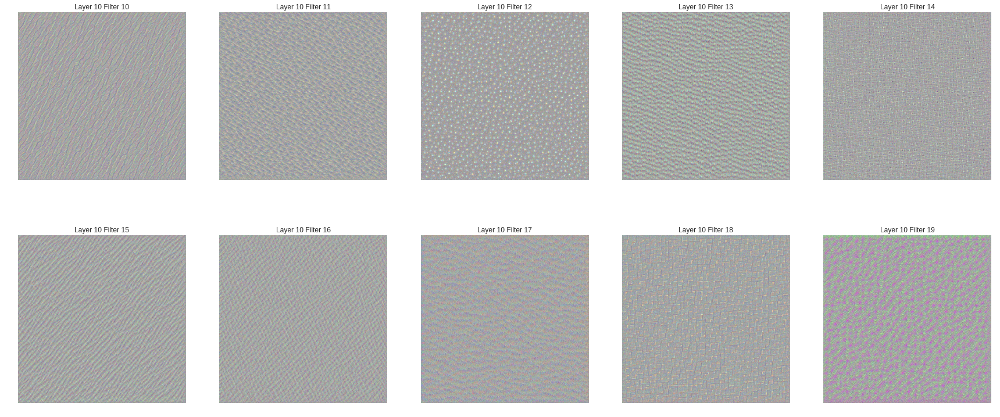

In [14]:
images, titles = show_layer(10)

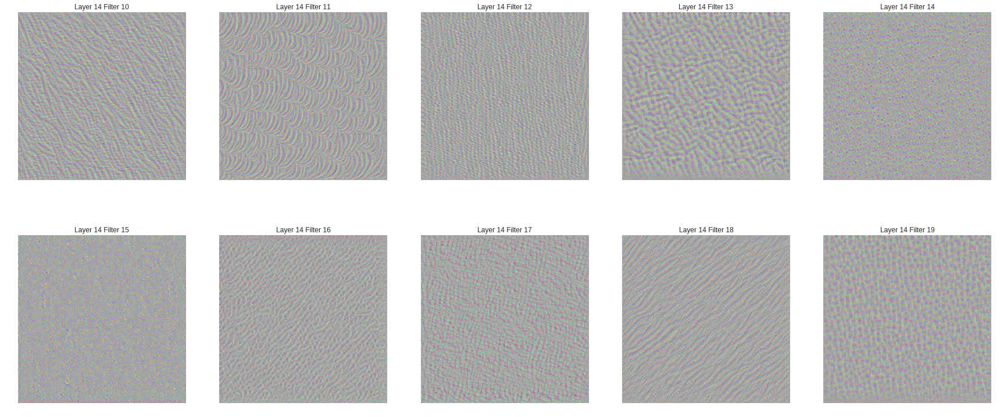

In [15]:
images, titles = show_layer(14)

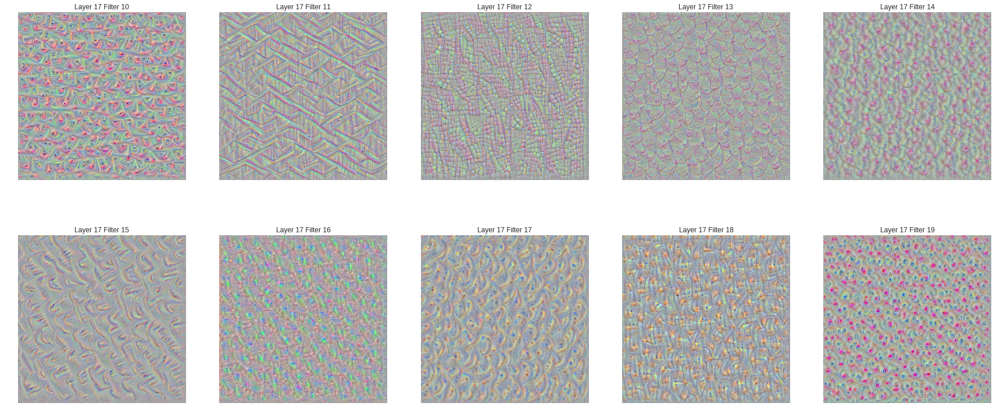

In [16]:
images, titles = show_layer(17)

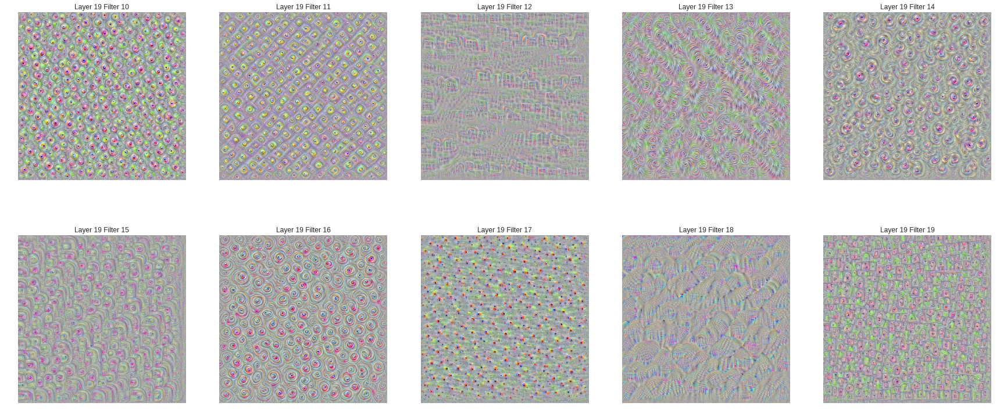

In [17]:
images, titles = show_layer(19)

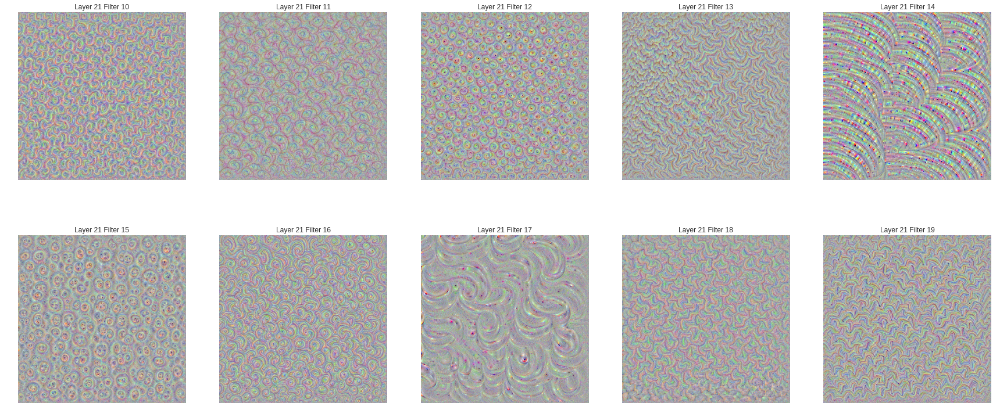

In [18]:
images, titles = show_layer(21)

## Deep Dream

In [0]:
def objective(dst, guide_features):
    if guide_features is None:
        return dst.data
    else:
        x = dst.data[0].cpu().numpy()
        y = guide_features.data[0].cpu().numpy()
        ch, w, h = x.shape
        x = x.reshape(ch, -1)
        y = y.reshape(ch, -1)
        A = x.T.dot(y)
        diff = y[:, A.argmax(1)]
        diff = torch.Tensor(np.array([diff.reshape(ch, w, h)])).cuda()
        return diff

def make_step(model, img, objective=objective, control=None, step_size=1.5, end=28, jitter=32):
    global use_gpu
    
    mean = np.array([0.485, 0.456, 0.406]).reshape([3, 1, 1])
    std = np.array([0.229, 0.224, 0.225]).reshape([3, 1, 1])
    
    ox, oy = np.random.randint(-jitter, jitter+1, 2)
    
    img = np.roll(np.roll(img, ox, -1), oy, -2)
    tensor = torch.Tensor(img) 
    
    if use_gpu:
        img_var = Variable(tensor.cuda(), requires_grad=True)
    else:
        img_var = Variable(tensor, requires_grad=True)
    
    model.zero_grad()
      
    dst = img_var
    for index, layer in enumerate(model.features.children()):
        dst = layer(dst)
        if index == end:
            break
    
    delta = objective(dst, control)
    dst.backward(delta)
    
    ratio = torch.abs(img_var.grad.data).mean()
    img_var.data.add_(img_var.grad.data * step_size / ratio)
    
    result = img_var.data.cpu().numpy()
    result = np.roll(np.roll(result, -ox, -1), -oy, -2)
    result[0, :, :, :] = np.clip(result[0, :, :, :], -mean / std, (1 - mean) / std)
    showtensor(result)
    
    return torch.Tensor(result)
                                                             
def deepdream(model, base_img, octave_n=6, octave_scale=1.4, iter_n=10, end=28, control=None, objective=objective, step_size=1.5, jitter=32):
    return octaver_fn(model, base_img, step_fn=make_step, 
                      octave_n=octave_n, octave_scale=octave_scale, 
                      iter_n=iter_n, end=end, control=control,
                      objective=objective, step_size=step_size, jitter=jitter)

(1070, 713)


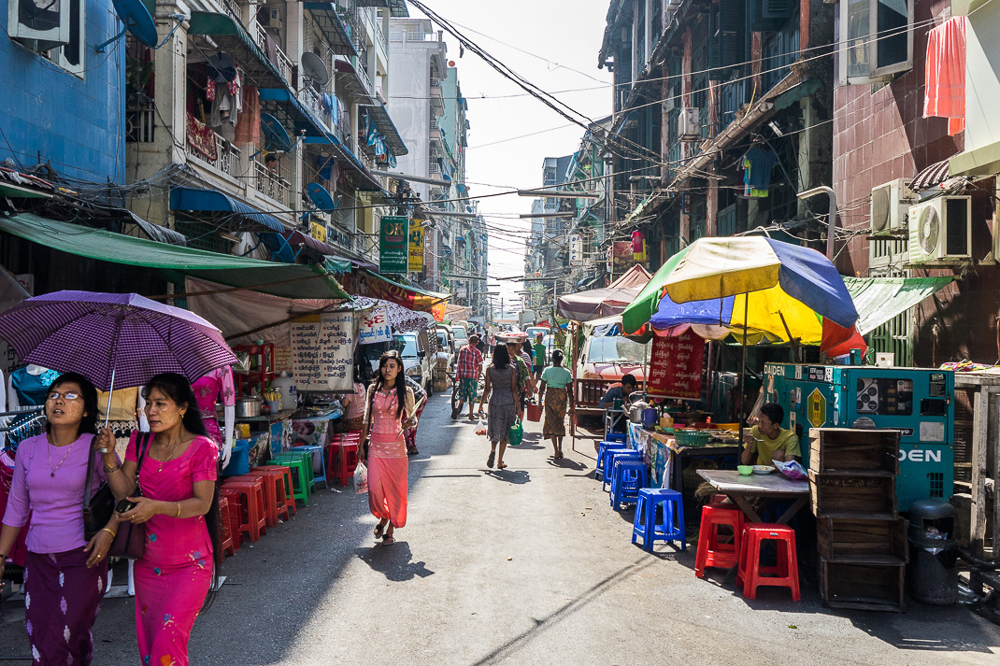

In [20]:
input_img, input_tensor, input_np = load_image('market.jpg')

print(input_img.size)
input_img

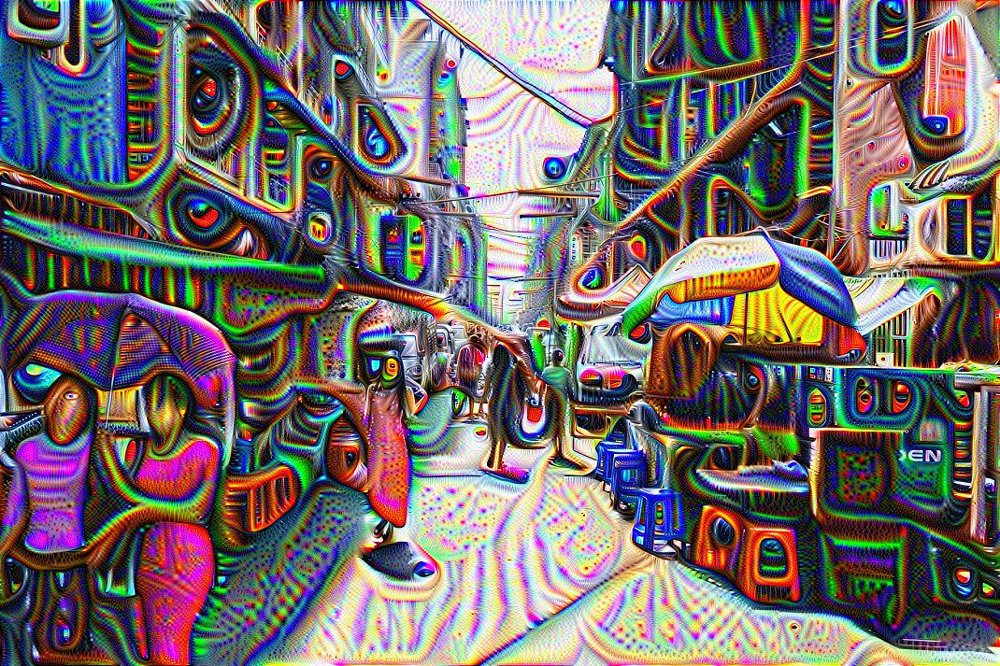

In [24]:
dream = deepdream(model, input_np, end=14, step_size=0.06, octave_n=6)

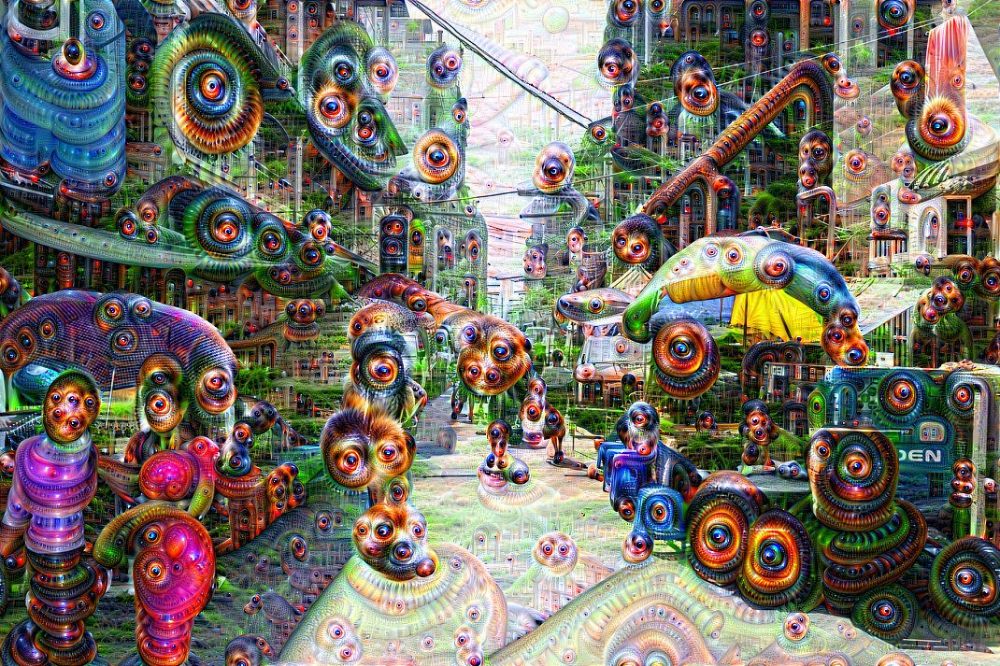

In [25]:
dream = deepdream(model, input_np, end=20, step_size=0.06, octave_n=6)

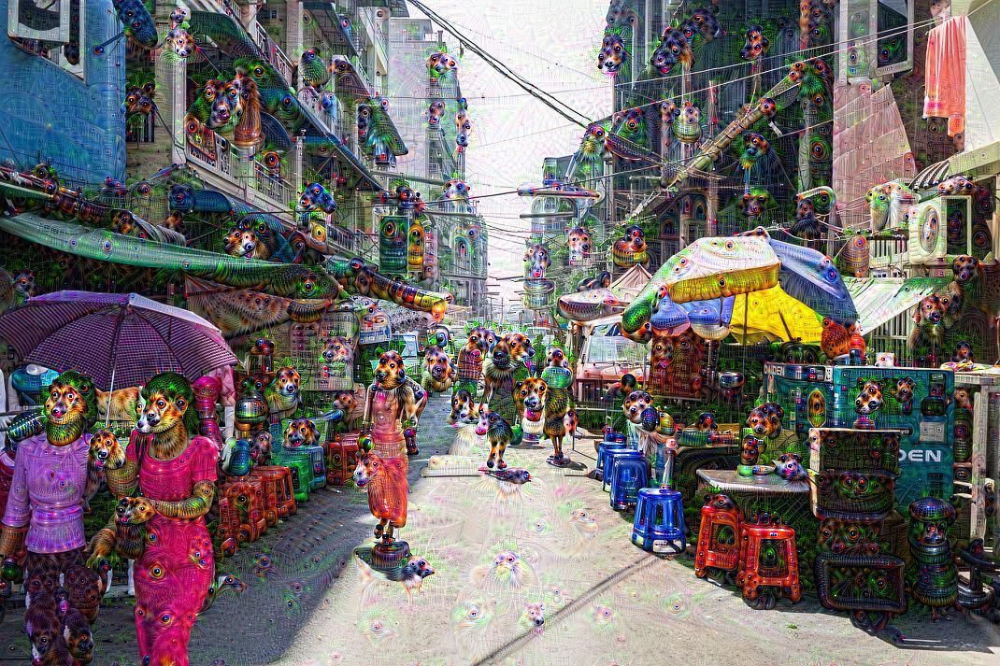

In [35]:
dream = deepdream(model, input_np, end=24, step_size=0.06, octave_n=2)

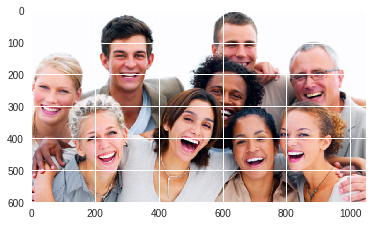

In [48]:
guide_img, guide_img_tensor, guide_img_np = load_image('people.jpg', resize=True)
plt.imshow(guide_img)

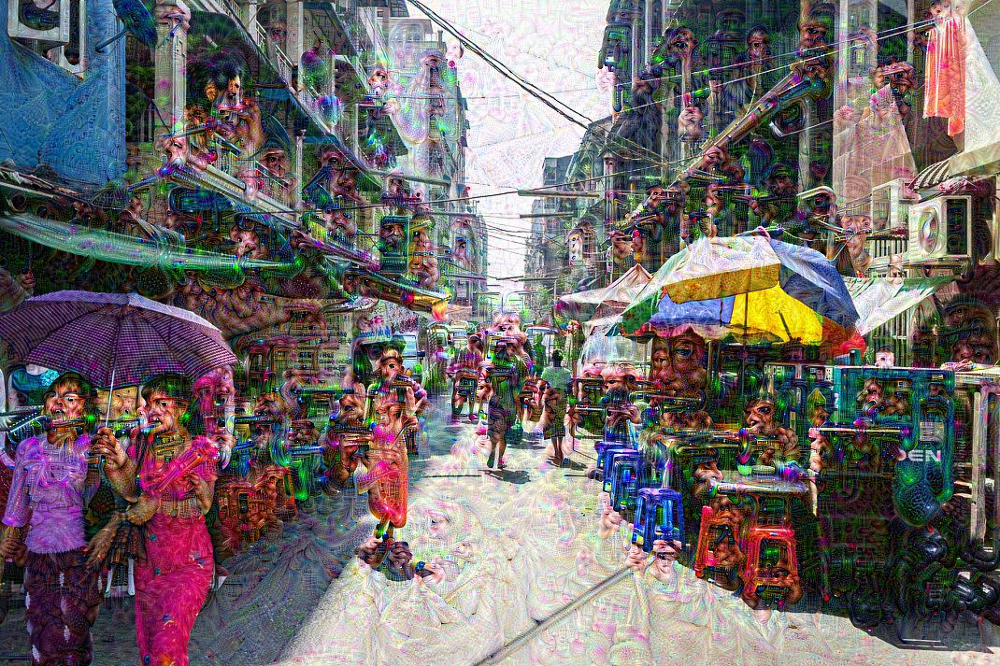

In [53]:
end = 29

guide_features = image_to_variable(guide_img_tensor, cuda=use_gpu)

for index, layer in enumerate(model.features.children()):
    guide_features = layer(guide_features)
    if index == end:
        break
    
dream = deepdream(model, input_np, end=end, step_size=0.06, octave_n=3, control=guide_features)